In [40]:
import scanpy as sc
import squidpy as sq
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

In [41]:
# set directory
sample_dir = "/beegfs/scratch/ric.cosr/ric.cosr/DellabonaP/CosMX/5_Raw_data/R5630_Slide4"

In [72]:
#load data
adata = sq.read.nanostring(
    path=sample_dir,
    counts_file="R5630_Slide4_exprMat_file.csv",
    meta_file="R5630_Slide4_metadata_file.csv",
    fov_file="R5630_Slide4_fov_positions_file.csv",
)

In [73]:
#total number of cells and genes
adata.shape

(32869, 979)

In [74]:
#total number of fovs
len(set(adata.obs["fov"]))

10

In [75]:
#fovs IDs
set(adata.obs["fov"])

{'1', '10', '2', '3', '4', '5', '6', '7', '8', '9'}

Make the variable names (gene names) unique using the method anndata.var_names_make_unique. Obtain the mitochondrial genes using their names prefixed with “mt-”. Calculate the quality control metrics on the anndata.AnnData using scanpy.pp.calculate_qc_metrics.

In [76]:
len(adata.var_names)

979

In [77]:
adata.var_names_make_unique()
adata.var["mt"] = adata.var_names.str.startswith("mt-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

In [78]:
len(adata.var_names)

979

In [79]:
adata.var_names

Index(['AATK', 'ABL1', 'ABL2', 'ACE', 'ACE2', 'ACKR1', 'ACKR3', 'ACKR4',
       'ACTA2', 'ACTG2',
       ...
       'NegPrb13', 'NegPrb14', 'NegPrb15', 'NegPrb16', 'NegPrb18', 'NegPrb19',
       'NegPrb20', 'NegPrb21', 'NegPrb22', 'NegPrb23'],
      dtype='object', length=979)

In [80]:
import squidpy.gr as sqgr


In [50]:
print(f"Total number of cells in dataset: {adata.n_obs}")

Total number of cells in dataset: 32869


A violin plot of some of the computed quality measures:

the number of genes expressed in the count matrix
and the total counts per cell

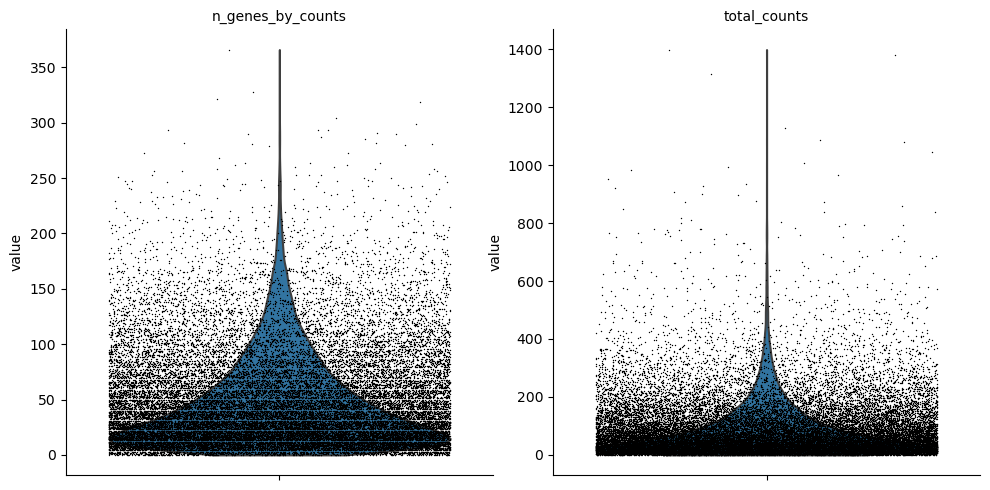

In [52]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts'],
             jitter=0.4, multi_panel=True)

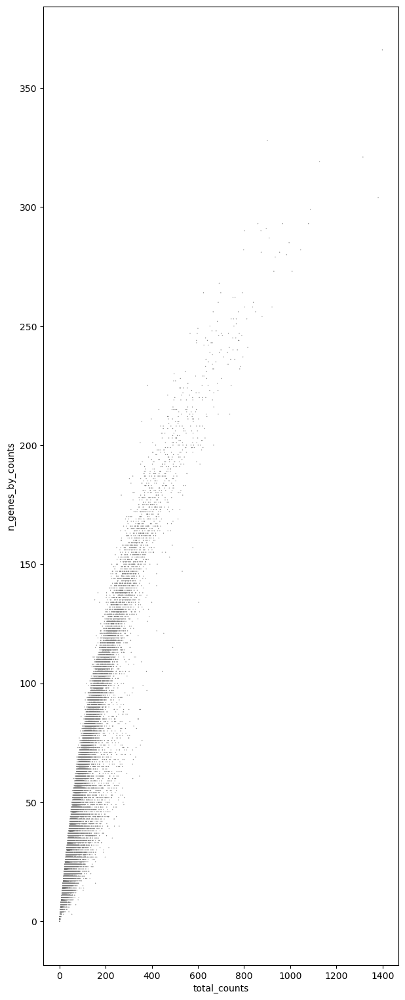

In [53]:
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

Calculate quality control metrics

Plot the “total_counts” and “n_genes_by_counts” from adata.obs. The first subplot shows adata.obs["total_counts"], the second adata.obs["total_counts"] less than 10000. The third subplot displays adata.obs["n_genes_by_counts"] while the fourth displays the adata.obs["n_genes_by_counts"] less than 4000

/beegfs/scratch/tmp/ipykernel_71386/1730134711.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(adata.obs["total_counts"], kde=False, ax=axs[0])
/beegfs/scratch/tmp/ipykernel_71386/1730134711.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(adata.obs["total_counts"][adata.obs["total_counts

<Axes: xlabel='n_genes_by_counts'>

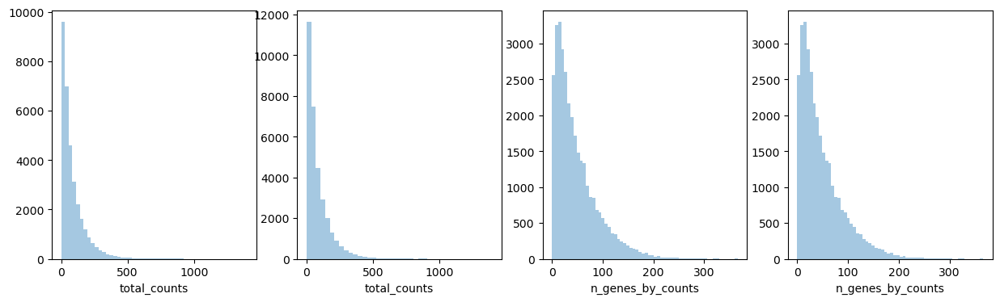

In [54]:
fig, axs = plt.subplots(1, 4, figsize=(15, 4))
sns.distplot(adata.obs["total_counts"], kde=False, ax=axs[0])
sns.distplot(adata.obs["total_counts"][adata.obs["total_counts"] < 10000], kde=False, bins=40, ax=axs[1])
sns.distplot(adata.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[2])
sns.distplot(adata.obs["n_genes_by_counts"][adata.obs["n_genes_by_counts"] < 4000], kde=False, bins=60, ax=axs[3])



/home/maurizio.aurora/seurat_spatial/lib/python3.9/site-packages/seaborn/distributions.py:2142: UserWarning: `displot` is a figure-level function and does not accept the ax= parameter. You may wish to try histplot.
  warnings.warn(msg, UserWarning)
/home/maurizio.aurora/seurat_spatial/lib/python3.9/site-packages/seaborn/distributions.py:2142: UserWarning: `displot` is a figure-level function and does not accept the ax= parameter. You may wish to try histplot.
  warnings.warn(msg, UserWarning)
/home/maurizio.aurora/seurat_spatial/lib/python3.9/site-packages/seaborn/distributions.py:2142: UserWarning: `displot` is a figure-level function and does not accept the ax= parameter. You may wish to try histplot.
  warnings.warn(msg, UserWarning)
/home/maurizio.aurora/seurat_spatial/lib/python3.9/site-packages/seaborn/distributions.py:2142: UserWarning: `displot` is a figure-level function and does not accept the ax= parameter. You may wish to try histplot.
  warnings.warn(msg, UserWarning)


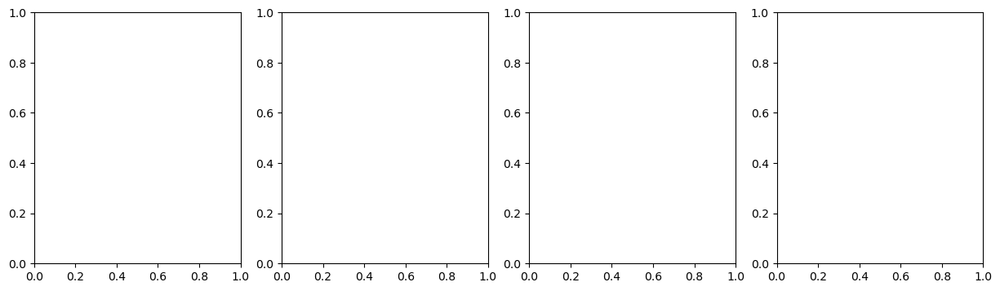

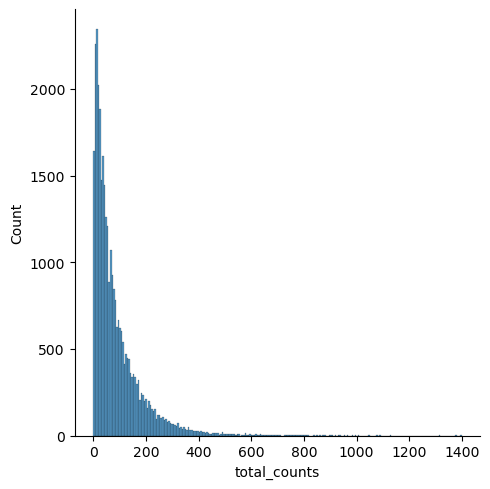

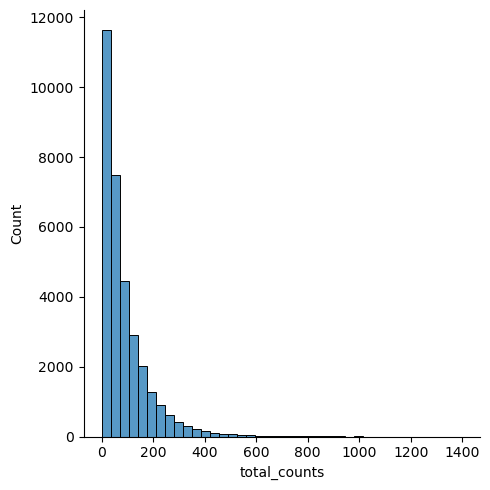

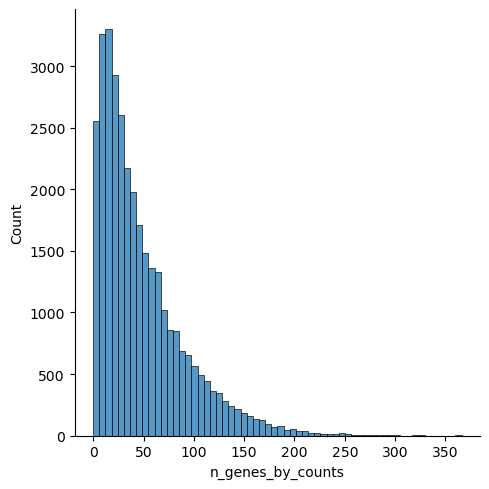

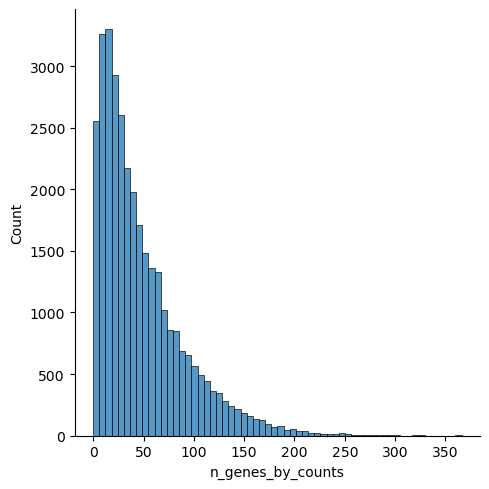

In [55]:
fig, axs = plt.subplots(1, 4, figsize=(15, 4))
sns.displot(
    adata.obs["total_counts"],
    kde=False,
    ax=axs[0],
)
sns.displot(
    adata.obs["total_counts"][adata.obs["total_counts"] < 10000],
    kde=False,
    bins=40,
    ax=axs[1],
)
sns.displot(
    adata.obs["n_genes_by_counts"],
    kde=False,
    bins=60,
    ax=axs[2],
)
sns.displot(
    adata.obs["n_genes_by_counts"][adata.obs["n_genes_by_counts"] < 4000],
    kde=False,
    bins=60,
    ax=axs[3],
)

Filter the cells based on the minimum number of counts required using scanpy.pp.filter_cells. Filter the genes based on the minimum number of cells required with scanpy.pp.filter_genes. The parameters for both were specified based on the plots above. They were set to filter out nearly 10% of the cells and genes with minimum counts and minimum cells respectively. It’s a conservative filtering, more relaxed ones could be also useful.

In [56]:
sc.pp.filter_cells(adata, min_counts=100)
sc.pp.filter_genes(adata, min_cells=400)

Annotate the highly variable genes based on the count data by using scanpy.pp.highly_variable_genes with flavor="seurat_v3". Normalize counts per cell using scanpy.pp.normalize_total.

Logarithmize, do principal component analysis, compute a neighborhood graph of the observations using scanpy.pp.log1p, scanpy.pp.pca and scanpy.pp.neighbors respectively.

Use scanpy.tl.umap to embed the neighborhood graph of the data and cluster the cells into subgroups employing scanpy.tl.leiden.

You may have to install scikit-misc package for highly variable genes identification.



In [57]:
adata.layers["counts"] = adata.X.copy()
sc.pp.highly_variable_genes(adata, flavor="seurat_v3", n_top_genes=4000)
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata)

In [58]:
adata.obs.head

<bound method NDFrame.head of         fov   Area  AspectRatio  CenterX_global_px  CenterY_global_px  Width   
4_1       1  11947         1.61     -316427.190476      -20955.904762    161  \
6_1       1   7586         1.00     -314655.190476      -20956.904762    102   
8_1       1   4461         0.81     -314428.190476      -20947.904762     68   
11_1      1   7459         1.08     -314169.190476      -20954.904762    106   
12_1      1  10304         2.03     -314021.190476      -20948.904762    175   
...      ..    ...          ...                ...                ...    ...   
3604_10  10   2894         1.13     -293461.000000       17271.190476     71   
3626_10  10   2525         1.14     -292636.000000       17225.190476     67   
3628_10  10   4937         1.33     -293553.000000       17209.190476     93   
3657_10  10   2700         0.62     -293410.000000       17150.190476     52   
3671_10  10   3398         0.90     -293007.000000       17136.190476     61   

         

Visualize annotation on UMAP and spatial coordinates

Subplot with scatter plot in UMAP (Uniform Manifold Approximation and Projection) basis. The embedded points were colored, respectively, according to the total counts, number of genes by counts and leiden clusters in each of the subplots. This gives us some idea of what the data looks like.



/home/maurizio.aurora/seurat_spatial/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


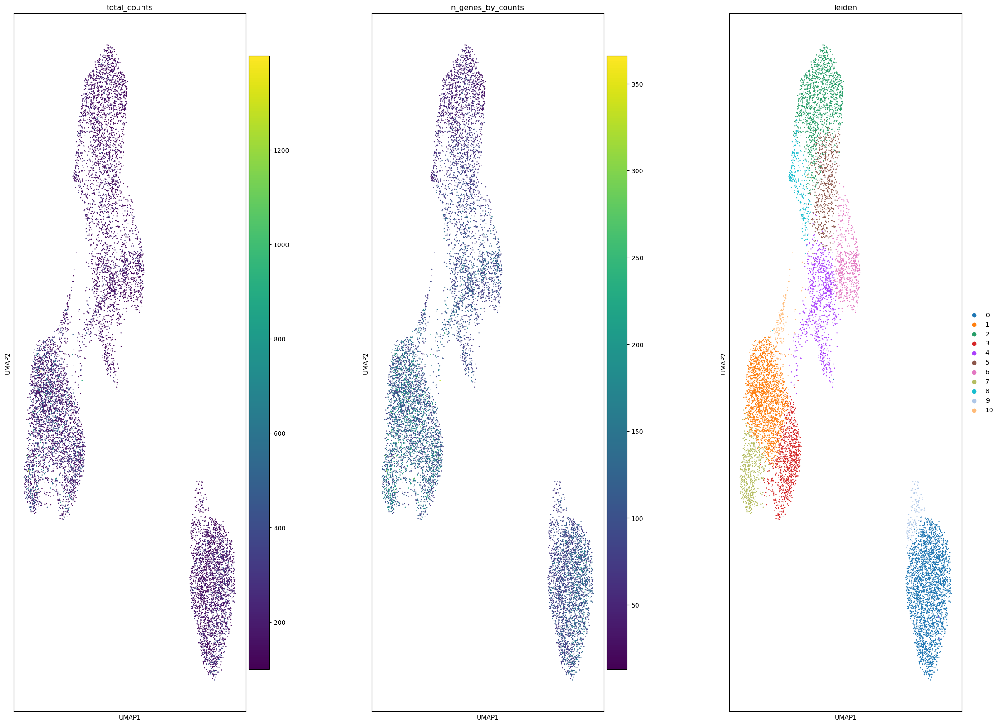

In [60]:
sc.pl.umap(
    adata,
    color=[
        "total_counts",
        "n_genes_by_counts",
        "leiden",
    ],
    wspace=0.4,
)

In [61]:
adata.obs['n_counts'].mean()

198.62317954985232

In [63]:
adata.obs['n_genes_by_counts'].mean()

98.26591302576637

In [64]:
adata.obs['n_genes_by_counts'].max()

366

In [66]:
adata.obs['n_counts'].max()

1399

In [62]:
list(adata.obs.columns)

['fov',
 'Area',
 'AspectRatio',
 'CenterX_global_px',
 'CenterY_global_px',
 'Width',
 'Height',
 'Mean.MembraneStain',
 'Max.MembraneStain',
 'Mean.PanCK',
 'Max.PanCK',
 'Mean.CD68',
 'Max.CD68',
 'Mean.CD3',
 'Max.CD3',
 'Mean.DAPI',
 'Max.DAPI',
 'cell_ID',
 'n_genes_by_counts',
 'log1p_n_genes_by_counts',
 'total_counts',
 'log1p_total_counts',
 'pct_counts_in_top_50_genes',
 'pct_counts_in_top_100_genes',
 'pct_counts_in_top_200_genes',
 'pct_counts_in_top_500_genes',
 'total_counts_mt',
 'log1p_total_counts_mt',
 'pct_counts_mt',
 'n_counts',
 'leiden']

In [14]:
print("in this slide are present", len(set(adata.obs["fov"])), "FOVs")

in this slide are present 10 FOVs


DAPI CD3 PanCK CD68

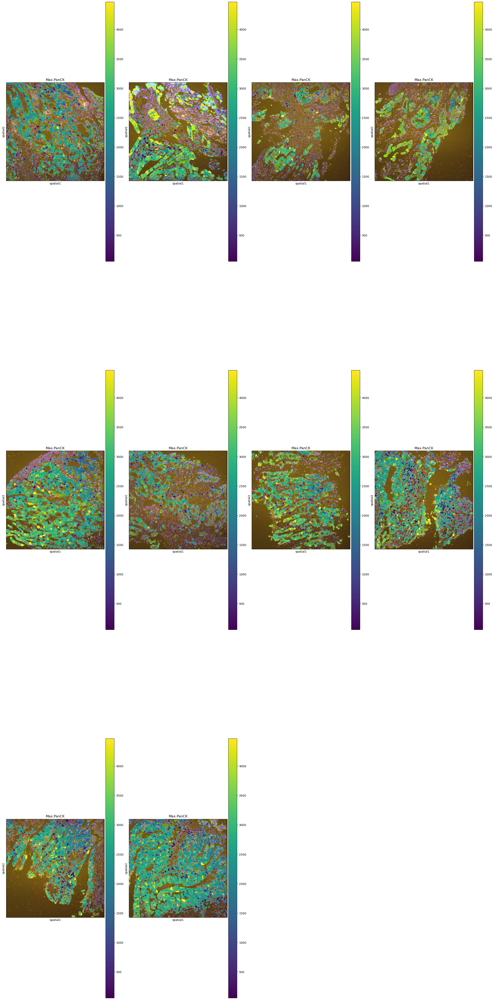

In [15]:
sq.pl.spatial_segment(
    adata,
    color="Max.PanCK",
    library_key="fov",
    seg_cell_id="cell_ID",
)

There are several parameters that can be controlled. For instance, it is possible to plot segmentation masks as “contours”, in order to visualize the underlying image. The co-ordinates of the FOV can be specified using the argument crop_coord, to get the view of required section.

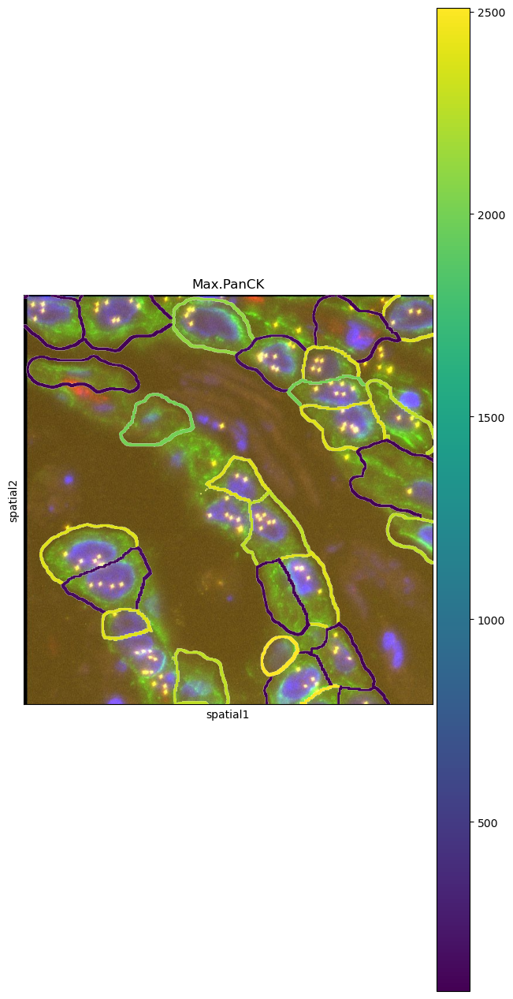

In [16]:
sq.pl.spatial_segment(
    adata,
    color="Max.PanCK",
    library_key="fov",
    library_id="1",
    seg_cell_id="cell_ID",
    seg_contourpx=10,
    crop_coord=[(0, 0, 700, 700)],
)

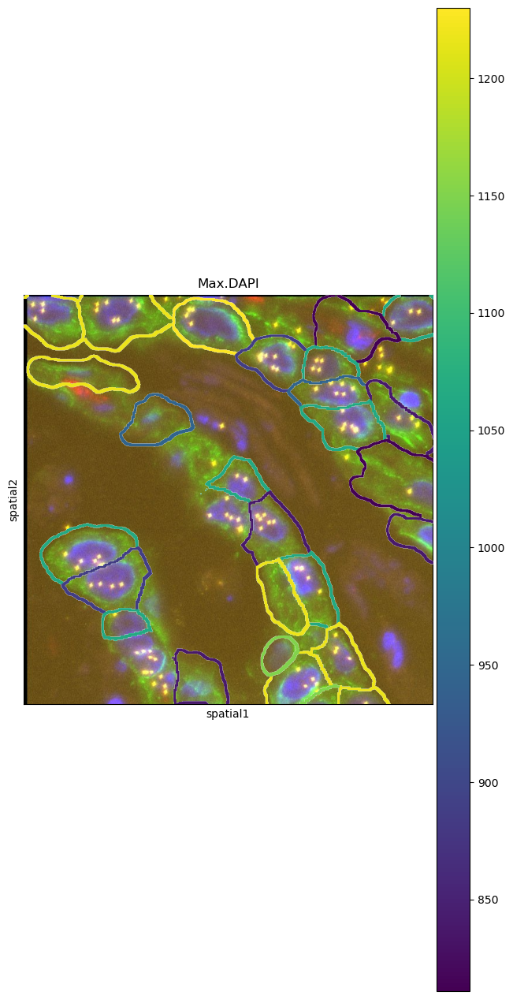

In [21]:
sq.pl.spatial_segment(
    adata,
    color="Max.DAPI",
    library_key="fov",
    library_id="1",
    seg_cell_id="cell_ID",
    seg_contourpx=10,
    crop_coord=[(0, 0, 700, 700)],
)

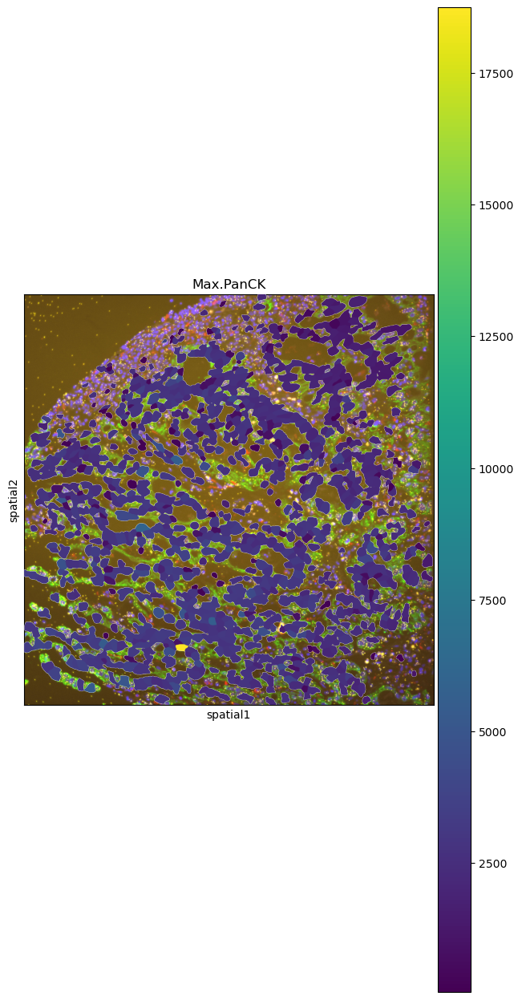

In [20]:
sq.pl.spatial_segment(
    adata,
    color="Max.PanCK",
    library_key="fov",
    library_id="4",
    seg_cell_id="cell_ID",
)

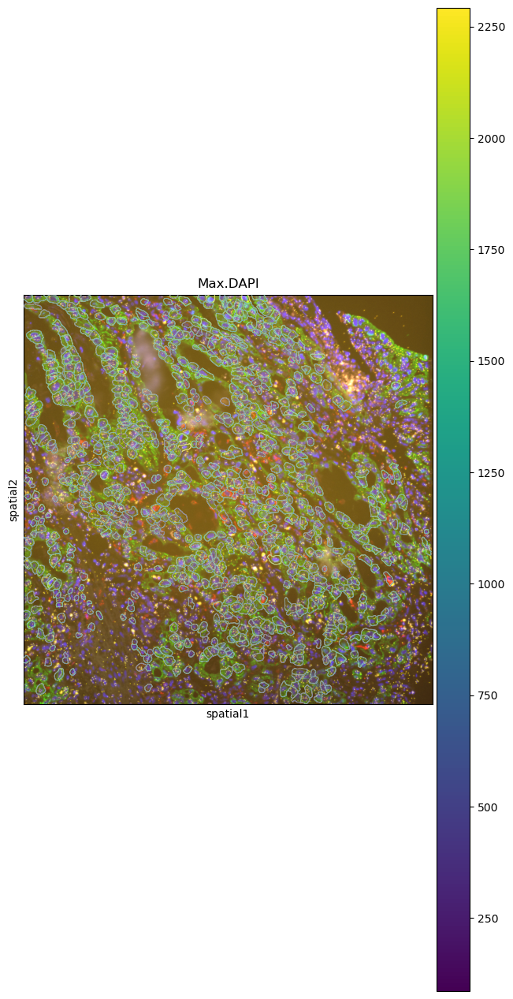

In [22]:
sq.pl.spatial_segment(
    adata,
    color="Max.DAPI",
    library_key="fov",
    library_id="1",
    seg_cell_id="cell_ID",
    seg_contourpx=10
)

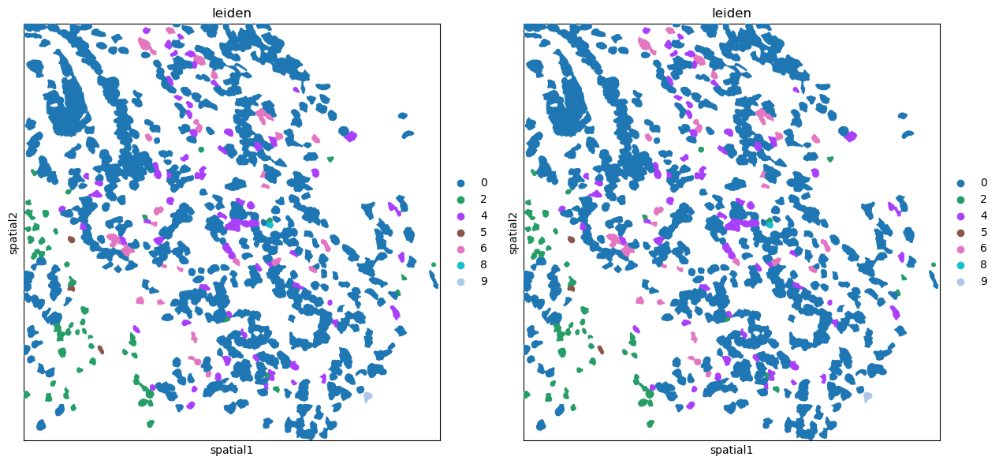

In [23]:
fig, ax = plt.subplots(1, 2, figsize=(15, 7))
sq.pl.spatial_segment(
    adata,
    shape="hex",
    color="leiden",
    library_key="fov",
    library_id="1",
    seg_cell_id="cell_ID",
    img=False,
    size=60,
    ax=ax[0],
)

sq.pl.spatial_segment(
    adata,
    color="leiden",
    seg_cell_id="cell_ID",
    library_key="fov",
    library_id="1",
    img=False,
    size=60,
    ax=ax[1],
)


Computation of spatial statistics

Building the spatial neighbors graphs

Spatial graph is a graph of spatial neighbors with observations as nodes and neighborhood relations between observations as edges. We use spatial coordinates of spots/cells to identify neighbors among them. Different approaches of defining a neighborhood relation among observations are used for different types of spatial datasets. We use squidpy.gr.spatial_neighbors to compute the spatial neighbors graph. We use this function for a non-grid dataset with coord_type = 'generic'.

Depending on the coord_type, n_neighs specifies the number of neighboring tiles if coord_type='grid' and when the coord_type is not a grid, n_neighs represents the number of neighborhoods. Moreover, radius is only available when coord_type='generic'.

Alternatively, delaunay = True can be used, for a Delaunay triangulation graph. This way, we can observe the difference in using K-nearest neighbors and Delaunay triangulation. You can appreciate that the neighbor graph is different than before.


In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(15, 15))
sq.gr.spatial_neighbors(
    adata,
    n_neighs=10,
    coord_type="generic",
)
_, idx = adata.obsp["spatial_connectivities"][420, :].nonzero()
idx = np.append(idx, 420)
sq.pl.spatial_scatter(
    adata[idx, :],
    library_id="1",
    color="leiden",
    connectivity_key="spatial_connectivities",
    size=3,
    edges_width=1,
    edges_color="black",
    img=False,
    title="K-nearest neighbors",
    ax=ax[0],
)

sq.gr.spatial_neighbors(
    adata,
    n_neighs=10,
    coord_type="generic",
    delaunay=True,
)
_, idx = adata.obsp["spatial_connectivities"][420, :].nonzero()
idx = np.append(idx, 420)
sq.pl.spatial_scatter(
    adata[idx, :],
    library_id="1",
    color="leiden",
    connectivity_key="spatial_connectivities",
    size=3,
    edges_width=1,
    edges_color="black",
    img=False,
    title="Delaunay triangulation",
    ax=ax[1],
)

The function builds a spatial graph and saves its adjacency matrix adata.obsp['spatial_connectivities'] and distances to adata.obsp['spatial_distances'] by default.

In [ ]:
adata.obsp["spatial_connectivities"]

In [ ]:
adata.obsp["spatial_distances"]

In order to get all spots within a specified radius (in units of the spatial coordinates) from each spot as neighbors, the parameter radius should be used. We can observe how this plot is unlike the above one.

In [ ]:
sq.gr.spatial_neighbors(
    adata,
    radius=30,
    coord_type="generic",
)

_, idx = adata.obsp["spatial_connectivities"][420, :].nonzero()
idx = np.append(idx, 420)
sq.pl.spatial_scatter(
    adata[idx, :],
    library_id="16",
    color="leiden",
    connectivity_key="spatial_connectivities",
    size=3,
    edges_width=1,
    edges_color="black",
    img=False,
)

In [ ]:
adata.obsp["spatial_connectivities"]
adata.obsp["spatial_distances"]

In [ ]:
Compute centrality scores

This example shows how to compute centrality scores, given a spatial graph and cell type annotation.

The scores calculated are closeness centrality, degree centrality and clustering coefficient with the following properties: * closeness centrality - measure of how close the group is to other nodes. * clustering coefficient - measure of the degree to which nodes cluster together. * degree centrality - fraction of non-group members connected to group members.

All scores are descriptive statistics of the spatial graph.

This dataset contains Leiden cluster groups’ annotations in anndata.AnnData.obs, which are used for calculation of centrality scores.

First, we need to compute a connectivity matrix from spatial coordinates to calculate the centrality scores. We can use squidpy.gr.spatial_neighbors for this purpose. We use the coord_type="generic" based on the data and the neighbors are classified with Delaunay triangulation by specifying delaunay=True.



In [ ]:
adata_spatial_neighbor = sq.gr.spatial_neighbors(
    adata, coord_type="generic", delaunay=True
)

Centrality scores are calculated with squidpy.gr.centrality_scores, with the Leiden clusters.

In [ ]:
sq.gr.centrality_scores(adata, cluster_key="leiden")

The results were visualized by plotting the average centrality, closeness centrality, and degree centrality using squidpy.pl.centrality_scores.

In [ ]:
sq.pl.centrality_scores(adata, cluster_key="leiden", figsize=(10, 6))

Compute co-occurrence probability

This example shows how to compute the co-occurrence probability.

The co-occurrence score is defined as:

 
p
(
e
x
p
|
c
o
n
d
)
p
(
e
x
p
)
where 
p
(
e
x
p
|
c
o
n
d
)
 is the conditional probability of observing a cluster 
e
x
p
 conditioned on the presence of a cluster 
c
o
n
d
, whereas 
p
(
e
x
p
)
 is the probability of observing 
e
x
p
 in the radius size of interest. The score is computed across increasing radii size around each cell in the tissue.

We can compute the co-occurrence score with squidpy.gr.co_occurrence. Results of co-occurrence probability ratio can be visualized with squidpy.pl.co_occurrence. The ‘3’ in the 
 
p
(
e
x
p
|
c
o
n
d
)
p
(
e
x
p
)
 represents a Leiden clustered group.



In [ ]:
adata_subset = adata[adata.obs.fov == "16"].copy()

We can further visualize tissue organization in spatial coordinates with squidpy.pl.spatial_segment, with an overlay of the expressed genes which were colored in consonance with the Leiden clusters.

In [ ]:
sq.gr.co_occurrence(
    adata_subset,
    cluster_key="leiden",
)
sq.pl.co_occurrence(
    adata_subset,
    cluster_key="leiden",
    clusters="3",
)


sq.pl.spatial_segment(
    adata_subset,
    shape="hex",
    color="leiden",
    library_id="16",
    library_key="fov",
    seg_cell_id="cell_ID",
    img=False,
    size=60,
)

Neighbors enrichment analysis

This example shows how to run the neighbors enrichment analysis routine.

It calculates an enrichment score based on proximity on the connectivity graph of cell clusters. The number of observed events is compared against 
N
 permutations and a z-score is computed.

This dataset contains cell type annotations in anndata.Anndata.obs which are used for calculation of the neighborhood enrichment. We calculate the neighborhood enrichment score with squidpy.gr.nhood_enrichment.

In [ ]:
sq.gr.nhood_enrichment(adata, cluster_key="leiden")

The same can be done for a specific FOV, by creating a subset of the anndata.AnnData.

In [ ]:
sq.gr.nhood_enrichment(adata_subset, cluster_key="leiden")

And visualize the results with squidpy.pl.nhood_enrichment.

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(22, 22))
sq.pl.nhood_enrichment(
    adata,
    cluster_key="leiden",
    figsize=(3, 3),
    ax=ax[0],
    title="Neighborhood enrichment adata",
)
sq.pl.nhood_enrichment(
    adata_subset,
    cluster_key="leiden",
    figsize=(3, 3),
    ax=ax[1],
    title="Neighborhood enrichment adata_subset",
)
sq.pl.spatial_segment(
    adata_subset,
    shape="hex",
    color="leiden",
    library_id="16",
    library_key="fov",
    seg_cell_id="cell_ID",
    img=False,
    size=60,
    ax=ax[2],
)

Compute Ripley’s statistics

This example shows how to compute the Ripley’s L function.

The Ripley’s L function is a descriptive statistics generally used to determine whether points have a random, dispersed or clustered distribution pattern at certain scale. The Ripley’s L is a variance-normalized version of the Ripley’s K statistic. There are also 2 other Ripley’s statistics available (that are closely related): ‘G’ and ‘F’.

Ripley’s G monitors the portion of points for which the nearest neighbor is within a given distance threshold, and plots that cumulative percentage against the increasing distance radii.

For increasing separation range, Ripley’s F function assembles the percentage of points which can be found in the aforementioned range from an arbitrary point pattern spawned in the expanse of the noticed pattern.

We can compute the Ripley’s L function with squidpy.gr.ripley. Results can be visualized with squidpy.pl.ripley. The same was plotted for adata_subset. Other Ripley’s statistics can be specified using mode = 'G' or mode = 'F'.



In [ ]:
mode = "L"
fig, ax = plt.subplots(1, 2, figsize=(20, 6))

sq.gr.ripley(adata_subset, cluster_key="leiden", mode=mode)
sq.pl.ripley(
    adata_subset,
    cluster_key="leiden",
    mode=mode,
    ax=ax[0],
)

sq.pl.spatial_segment(
    adata_subset,
    shape="hex",
    color="leiden",
    library_id="16",
    library_key="fov",
    seg_cell_id="cell_ID",
    img=False,
    size=60,
    ax=ax[1],
)

Compute Moran’s I score

This example shows how to compute the Moran’s I global spatial auto-correlation statistics.

The Moran’s I global spatial auto-correlation statistics evaluates whether features (i.e. genes) shows a pattern that is clustered, dispersed or random in the tissue are under consideration.

We can compute the Moran’s I score with squidpy.gr.spatial_autocorr and mode = 'moran'. We first need to compute a spatial graph with squidpy.gr.spatial_neighbors. We will also subset the number of genes to evaluate.

In [ ]:
sq.gr.spatial_neighbors(adata_subset, coord_type="generic", delaunay=True)
sq.gr.spatial_autocorr(
    adata_subset,
    mode="moran",
    n_perms=100,
    n_jobs=1,
)
adata_subset.uns["moranI"].head(10)

We can visualize some of those genes with squidpy.pl.spatial_segment. We could also pass mode = 'geary' to compute a closely related auto-correlation statistic, Geary’s C. See squidpy.gr.spatial_autocorr for more information.

In [ ]:
sq.pl.spatial_segment(
    adata_subset,
    library_id="16",
    seg_cell_id="cell_ID",
    library_key="fov",
    color=["KRT19", "ANXA2", "COL1A1"],
    size=60,
    img=False,
)